In [2]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

root = r'.\mabe_data'
suffix = 'csv'
fullFilePaths = []

currentFolder = os.listdir(root)
for name in currentFolder:
    if name.endswith(suffix):
        fullFilePaths.append(os.path.join(root, name))

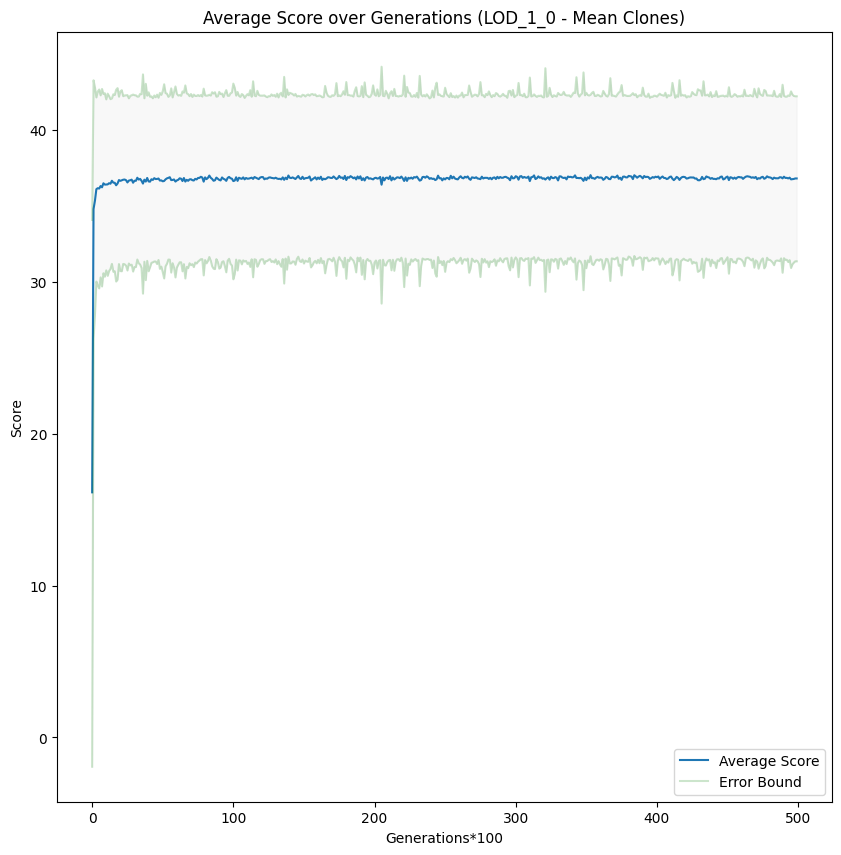

In [3]:
files_1_0 = []
for file in fullFilePaths:
    if "LOD_1_0" in file:
        files_1_0.append(file)

# create inital df
df_1_0 = pd.read_csv(files_1_0[0])
df_1_0_score = df_1_0[['score']]

# loop through all the different files
for file in files_1_0[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    score = LOD_data[['score']]
    df_1_0_score = pd.concat([df_1_0_score, score], axis=1)

df_1_0_score['mean'] = df_1_0_score.mean(axis=1)
df_1_0_score['std'] = df_1_0_score.std(axis=1)
df_1_0_score['hstd'] = df_1_0_score['mean'] + (2*df_1_0_score.std(axis=1))
df_1_0_score['lstd'] = df_1_0_score['mean'] - (2*df_1_0_score.std(axis=1))

plt.figure(figsize=(10,10))
plt.title('Average Score over Generations (LOD_1_0 - Mean Clones)')
plt.xlabel('Generations*100')
plt.ylabel('Score')
plt.plot(range(500), df_1_0_score['mean'], label='Average Score')
plt.plot(range(500), df_1_0_score['hstd'], label='Error Bound', alpha=0.2, color='green')
plt.plot(range(500), df_1_0_score['lstd'], alpha=0.2, color='green')
plt.fill_between(range(500), df_1_0_score['lstd'], df_1_0_score['hstd'], color='grey', alpha=0.05)
plt.legend()
plt.show()

C:\Users\tveldhuis\AppData\Local\Temp\ipykernel_12016\316115104.py:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_1_0_rScores['rawScores'] = df_1_0_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')


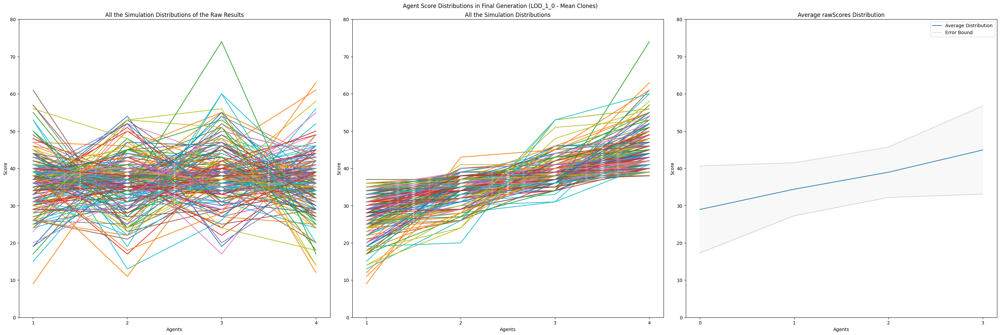

In [4]:
df_1_0_rScores = df_1_0[['rawScores']].tail(1)

# loop through all the different files
for file in files_1_0[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    rawScore = LOD_data[['rawScores']].tail(1)
    df_1_0_rScores = pd.concat([df_1_0_rScores, rawScore])
    
df_1_0_rScores['rawScores'] = df_1_0_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')
df_1_0_rScoresSorted = pd.DataFrame(np.sort(df_1_0_rScores["rawScores"].str.split(',', expand=True).values.astype(float)), columns=['1', '2', '3', '4'])
df_1_0_rScores = pd.DataFrame(df_1_0_rScores["rawScores"].str.split(',', expand=True).values.astype(float), columns=['1', '2', '3', '4'])

fig, axs = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)
fig.suptitle('Agent Score Distributions in Final Generation (LOD_1_0 - Mean Clones)')

ymax = 80
hstd_1_0 = df_1_0_rScoresSorted.mean(axis=0)+(2*df_1_0_rScoresSorted.std(axis=0))
lstd_1_0 = df_1_0_rScoresSorted.mean(axis=0)-(2*df_1_0_rScoresSorted.std(axis=0))

# Raw plot for LOD_1_0
axs[0].set_title(f'All the Simulation Distributions of the Raw Results')
axs[0].set_xlabel('Agents')
axs[0].set_ylabel('Score')
axs[0].set_ylim(ymax=ymax)
for index, row in df_1_0_rScores.iterrows():
    axs[0].plot(row, label=index)


# Sorted plot for LOD_1_0
axs[1].set_title(f'All the Simulation Distributions')
axs[1].set_xlabel('Agents')
axs[1].set_ylabel('Score')
axs[1].set_ylim(ymax=ymax)
for index, row in df_1_0_rScoresSorted.iterrows():
    axs[1].plot(row, label=index)

# Plot for LOD_1_0
axs[2].set_title(f'Average rawScores Distribution')
axs[2].set_xlabel('Agents')
axs[2].set_ylabel('Score')
axs[2].set_ylim(ymax=ymax)
axs[2].plot(range(4), df_1_0_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[2].plot(range(4), lstd_1_0, label='Error Bound', alpha=0.2, color='green')
axs[2].plot(range(4), hstd_1_0, alpha=0.2, color='green')
axs[2].fill_between(range(4), lstd_1_0, hstd_1_0, color='grey', alpha=0.05)
axs[2].set_xticks(range(4), range(4))
axs[2].legend()

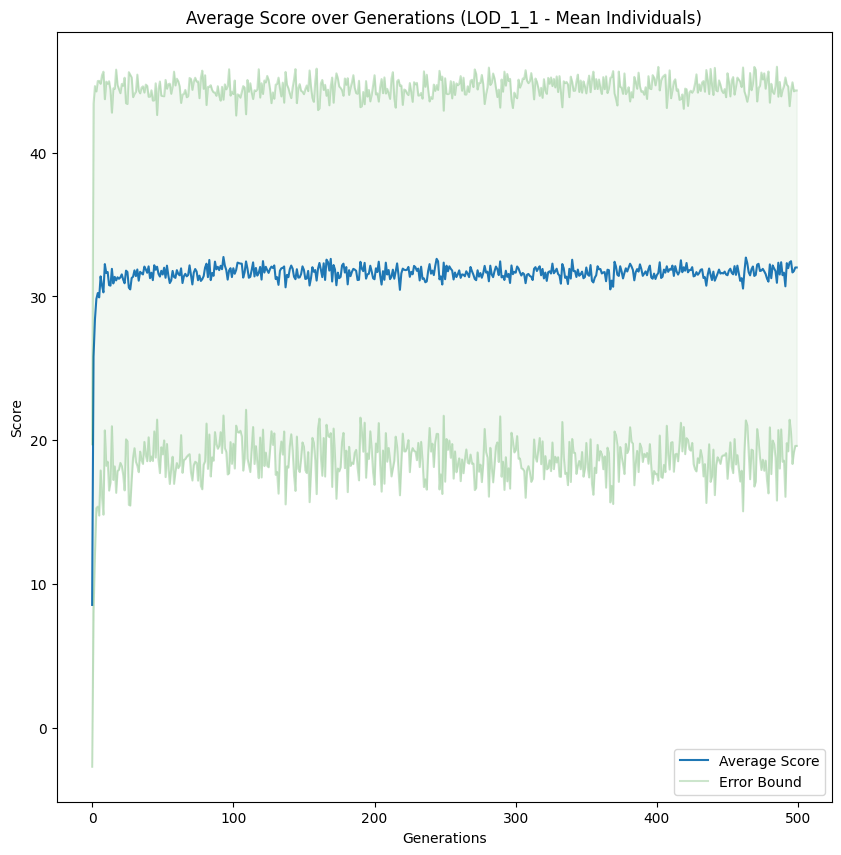

In [5]:
files_1_1 = []
for file in fullFilePaths:
    if "LOD_1_1" in file:
        files_1_1.append(file)

# create inital df
df_1_1 = pd.read_csv(files_1_1[0])
df_1_1_score = df_1_1[['score']]

# loop through all the different files
for file in files_1_1[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    score = LOD_data[['score']]
    df_1_1_score = pd.concat([df_1_1_score, score], axis=1)

df_1_1_score['mean'] = df_1_1_score.mean(axis=1)
df_1_1_score['std'] = df_1_1_score.std(axis=1)
df_1_1_score['hstd'] = df_1_1_score['mean'] + (2*df_1_1_score.std(axis=1))
df_1_1_score['lstd'] = df_1_1_score['mean'] - (2*df_1_1_score.std(axis=1))

plt.figure(figsize=(10,10))
plt.title('Average Score over Generations (LOD_1_1 - Mean Individuals)')
plt.xlabel('Generations')
plt.ylabel('Score')
plt.plot(range(500), df_1_1_score['mean'], label='Average Score')
plt.plot(range(500), df_1_1_score['hstd'], label='Error Bound', alpha=0.2, color='green')
plt.plot(range(500), df_1_1_score['lstd'], alpha=0.2, color='green')
plt.fill_between(range(500), df_1_1_score['lstd'], df_1_1_score['hstd'], color='green', alpha=0.05)
plt.legend()

C:\Users\tveldhuis\AppData\Local\Temp\ipykernel_12016\765180277.py:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_1_1_rScores['rawScores'] = df_1_1_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')


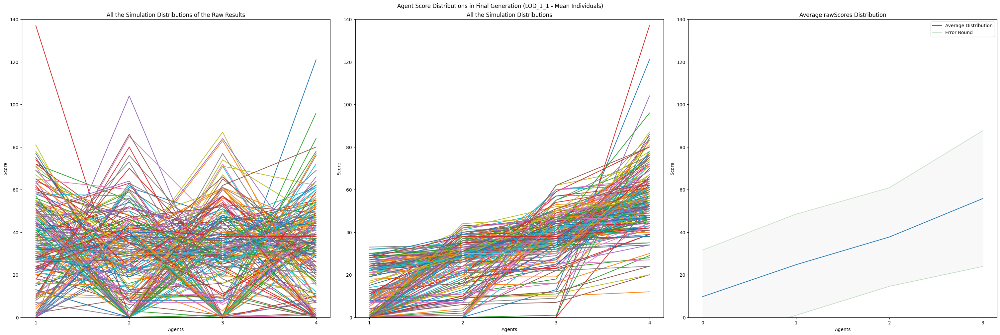

In [6]:
df_1_1_rScores = df_1_1[['rawScores']].tail(1)

# loop through all the different files
for file in files_1_1[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    rawScore = LOD_data[['rawScores']].tail(1)
    df_1_1_rScores = pd.concat([df_1_1_rScores, rawScore], axis=0)
    
df_1_1_rScores['rawScores'] = df_1_1_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')
df_1_1_rScoresSorted = pd.DataFrame(np.sort(df_1_1_rScores["rawScores"].str.split(',', expand=True).values.astype(float)), columns=['1', '2', '3', '4'])
df_1_1_rScores = pd.DataFrame(df_1_1_rScores["rawScores"].str.split(',', expand=True).values.astype(float), columns=['1', '2', '3', '4'])

fig, axs = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)
fig.suptitle('Agent Score Distributions in Final Generation (LOD_1_1 - Mean Individuals)')

ymax = 140
hstd_1_1 = df_1_1_rScoresSorted.mean(axis=0)+(2*df_1_1_rScoresSorted.std(axis=0))
lstd_1_1 = df_1_1_rScoresSorted.mean(axis=0)-(2*df_1_1_rScoresSorted.std(axis=0))

# Raw plot for LOD_1_1
axs[0].set_title(f'All the Simulation Distributions of the Raw Results')
axs[0].set_xlabel('Agents')
axs[0].set_ylabel('Score')
axs[0].set_ylim(ymax=ymax)
for index, row in df_1_1_rScores.iterrows():
    axs[0].plot(row, label=index)


# Sorted plot for LOD_1_1
axs[1].set_title(f'All the Simulation Distributions')
axs[1].set_xlabel('Agents')
axs[1].set_ylabel('Score')
axs[1].set_ylim(ymax=ymax)
for index, row in df_1_1_rScoresSorted.iterrows():
    axs[1].plot(row, label=index)

# Plot for LOD_1_1
axs[2].set_title(f'Average rawScores Distribution')
axs[2].set_xlabel('Agents')
axs[2].set_ylabel('Score')
axs[2].set_ylim(ymax=ymax)
axs[2].plot(range(4), df_1_1_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[2].plot(range(4), lstd_1_1, label='Error Bound', alpha=0.2, color='green')
axs[2].plot(range(4), hstd_1_1, alpha=0.2, color='green')
axs[2].fill_between(range(4), lstd_1_1, hstd_1_1, color='grey', alpha=0.05)
axs[2].set_xticks(range(4), range(4))
axs[2].legend()

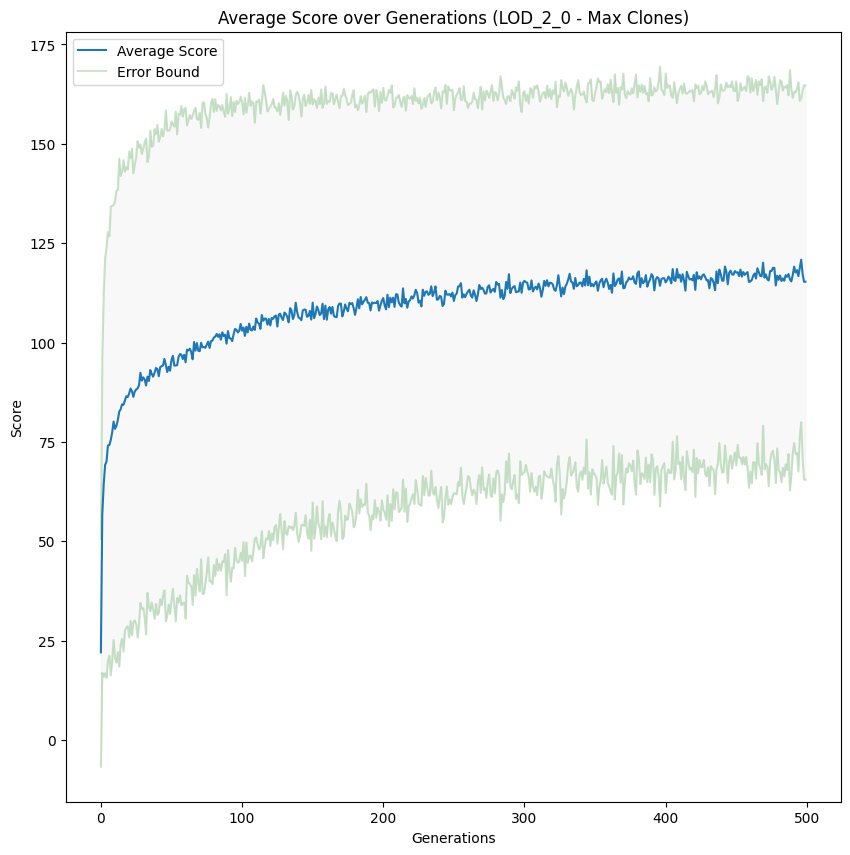

In [7]:
files_2_0 = []
for file in fullFilePaths:
    if "LOD_2_0" in file:
        files_2_0.append(file)

# create inital df
df_2_0 = pd.read_csv(files_2_0[0])
df_2_0_score = df_2_0[['score']]

# loop through all the different files
for file in files_2_0[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    score = LOD_data[['score']]
    df_2_0_score = pd.concat([df_2_0_score, score], axis=1)

df_2_0_score['mean'] = df_2_0_score.mean(axis=1)
df_2_0_score['std'] = df_2_0_score.std(axis=1)
df_2_0_score['hstd'] = df_2_0_score['mean'] + (2*df_2_0_score.std(axis=1))
df_2_0_score['lstd'] = df_2_0_score['mean'] - (2*df_2_0_score.std(axis=1))

plt.figure(figsize=(10,10))
plt.title('Average Score over Generations (LOD_2_0 - Max Clones)')
plt.xlabel('Generations')
plt.ylabel('Score')
plt.plot(range(500), df_2_0_score['mean'], label='Average Score')
plt.plot(range(500), df_2_0_score['hstd'], label='Error Bound', alpha=0.2, color='green')
plt.plot(range(500), df_2_0_score['lstd'], alpha=0.2, color='green')
plt.fill_between(range(500), df_2_0_score['lstd'], df_2_0_score['hstd'], color='grey', alpha=0.05)
plt.legend()
plt.show()

C:\Users\tveldhuis\AppData\Local\Temp\ipykernel_12016\2955501209.py:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_2_0_rScores['rawScores'] = df_2_0_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')


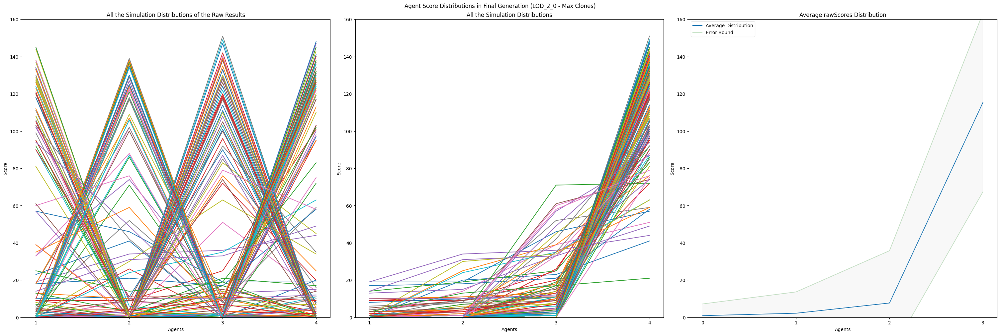

In [8]:
df_2_0_rScores = df_2_0[['rawScores']].tail(1)

# loop through all the different files
for file in files_2_0[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    rawScore = LOD_data[['rawScores']].tail(1)
    df_2_0_rScores = pd.concat([df_2_0_rScores, rawScore], axis=0)
    
df_2_0_rScores['rawScores'] = df_2_0_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')
df_2_0_rScoresSorted = pd.DataFrame(np.sort(df_2_0_rScores["rawScores"].str.split(',', expand=True).values.astype(float)), columns=['1', '2', '3', '4'])
df_2_0_rScores = pd.DataFrame(df_2_0_rScores["rawScores"].str.split(',', expand=True).values.astype(float), columns=['1', '2', '3', '4'])

fig, axs = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)
fig.suptitle('Agent Score Distributions in Final Generation (LOD_2_0 - Max Clones)')

ymax = 160
hstd_2_0 = df_2_0_rScoresSorted.mean(axis=0)+(2*df_2_0_rScoresSorted.std(axis=0))
lstd_2_0 = df_2_0_rScoresSorted.mean(axis=0)-(2*df_2_0_rScoresSorted.std(axis=0))

# Raw plot for LOD_2_0
axs[0].set_title(f'All the Simulation Distributions of the Raw Results')
axs[0].set_xlabel('Agents')
axs[0].set_ylabel('Score')
axs[0].set_ylim(ymax=ymax)
for index, row in df_2_0_rScores.iterrows():
    axs[0].plot(row, label=index)


# Sorted plot for LOD_2_0
axs[1].set_title(f'All the Simulation Distributions')
axs[1].set_xlabel('Agents')
axs[1].set_ylabel('Score')
axs[1].set_ylim(ymax=ymax)
for index, row in df_2_0_rScoresSorted.iterrows():
    axs[1].plot(row, label=index)

# Plot for LOD_2_0
axs[2].set_title(f'Average rawScores Distribution')
axs[2].set_xlabel('Agents')
axs[2].set_ylabel('Score')
axs[2].set_ylim(ymax=ymax)
axs[2].plot(range(4), df_2_0_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[2].plot(range(4), lstd_2_0, label='Error Bound', alpha=0.2, color='green')
axs[2].plot(range(4), hstd_2_0, alpha=0.2, color='green')
axs[2].fill_between(range(4), lstd_2_0, hstd_2_0, color='grey', alpha=0.05)
axs[2].set_xticks(range(4), range(4))
axs[2].legend()

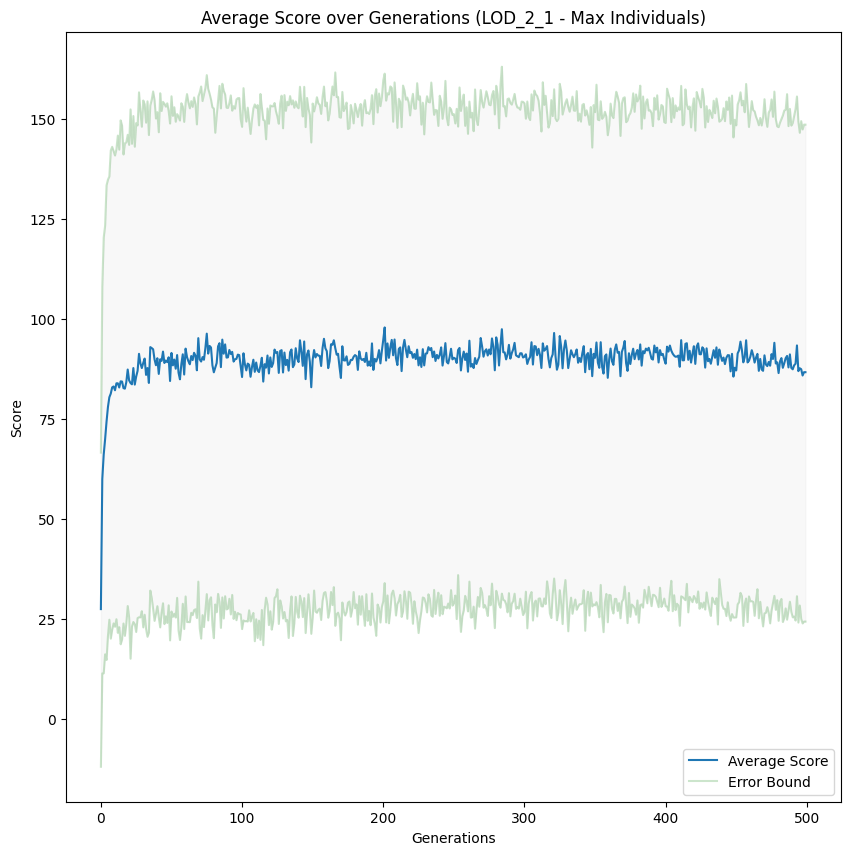

In [9]:
files_2_1 = []
for file in fullFilePaths:
    if "LOD_2_1" in file:
        files_2_1.append(file)

# create inital df
df_2_1 = pd.read_csv(files_2_1[0])
df_2_1_score = df_2_1[['score']]

# loop through all the different files
for file in files_2_1[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    score = LOD_data[['score']]
    df_2_1_score = pd.concat([df_2_1_score, score], axis=1)

df_2_1_score['mean'] = df_2_1_score.mean(axis=1)
df_2_1_score['std'] = df_2_1_score.std(axis=1)
df_2_1_score['hstd'] = df_2_1_score['mean'] + (2*df_2_1_score.std(axis=1))
df_2_1_score['lstd'] = df_2_1_score['mean'] - (2*df_2_1_score.std(axis=1))

plt.figure(figsize=(10,10))
plt.title('Average Score over Generations (LOD_2_1 - Max Individuals)')
plt.xlabel('Generations')
plt.ylabel('Score')
plt.plot(range(500), df_2_1_score['mean'], label='Average Score')
plt.plot(range(500), df_2_1_score['hstd'], label='Error Bound', alpha=0.2, color='green')
plt.plot(range(500), df_2_1_score['lstd'], alpha=0.2, color='green')
plt.fill_between(range(500), df_2_1_score['lstd'], df_2_1_score['hstd'], color='grey', alpha=0.05)
plt.legend()
plt.show()

C:\Users\tveldhuis\AppData\Local\Temp\ipykernel_12016\3850882283.py:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_2_1_rScores['rawScores'] = df_2_1_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')


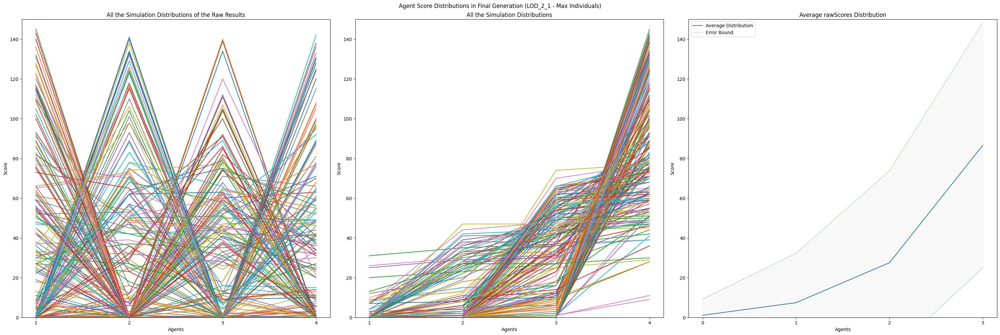

In [10]:
df_2_1_rScores = df_2_1[['rawScores']].tail(1)

# loop through all the different files
for file in files_2_1[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    rawScore = LOD_data[['rawScores']].tail(1)
    df_2_1_rScores = pd.concat([df_2_1_rScores, rawScore], axis=0)
    
df_2_1_rScores['rawScores'] = df_2_1_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')
df_2_1_rScoresSorted = pd.DataFrame(np.sort(df_2_1_rScores["rawScores"].str.split(',', expand=True).values.astype(float)), columns=['1', '2', '3', '4'])
df_2_1_rScores = pd.DataFrame(df_2_1_rScores["rawScores"].str.split(',', expand=True).values.astype(float), columns=['1', '2', '3', '4'])

fig, axs = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)
fig.suptitle('Agent Score Distributions in Final Generation (LOD_2_1 - Max Individuals)')

ymax = 150
hstd_2_1 = df_2_1_rScoresSorted.mean(axis=0)+(2*df_2_1_rScoresSorted.std(axis=0))
lstd_2_1 = df_2_1_rScoresSorted.mean(axis=0)-(2*df_2_1_rScoresSorted.std(axis=0))

# Raw plot for LOD_2_1
axs[0].set_title(f'All the Simulation Distributions of the Raw Results')
axs[0].set_xlabel('Agents')
axs[0].set_ylabel('Score')
axs[0].set_ylim(ymax=ymax)
for index, row in df_2_1_rScores.iterrows():
    axs[0].plot(row, label=index)


# Sorted plot for LOD_2_1
axs[1].set_title(f'All the Simulation Distributions')
axs[1].set_xlabel('Agents')
axs[1].set_ylabel('Score')
axs[1].set_ylim(ymax=ymax)
for index, row in df_2_1_rScoresSorted.iterrows():
    axs[1].plot(row, label=index)

# Plot for LOD_2_1
axs[2].set_title(f'Average rawScores Distribution')
axs[2].set_xlabel('Agents')
axs[2].set_ylabel('Score')
axs[2].set_ylim(ymax=ymax)
axs[2].plot(range(4), df_2_1_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[2].plot(range(4), lstd_2_1, label='Error Bound', alpha=0.2, color='green')
axs[2].plot(range(4), hstd_2_1, alpha=0.2, color='green')
axs[2].fill_between(range(4), lstd_2_1, hstd_2_1, color='grey', alpha=0.05)
axs[2].set_xticks(range(4), range(4))
axs[2].legend()

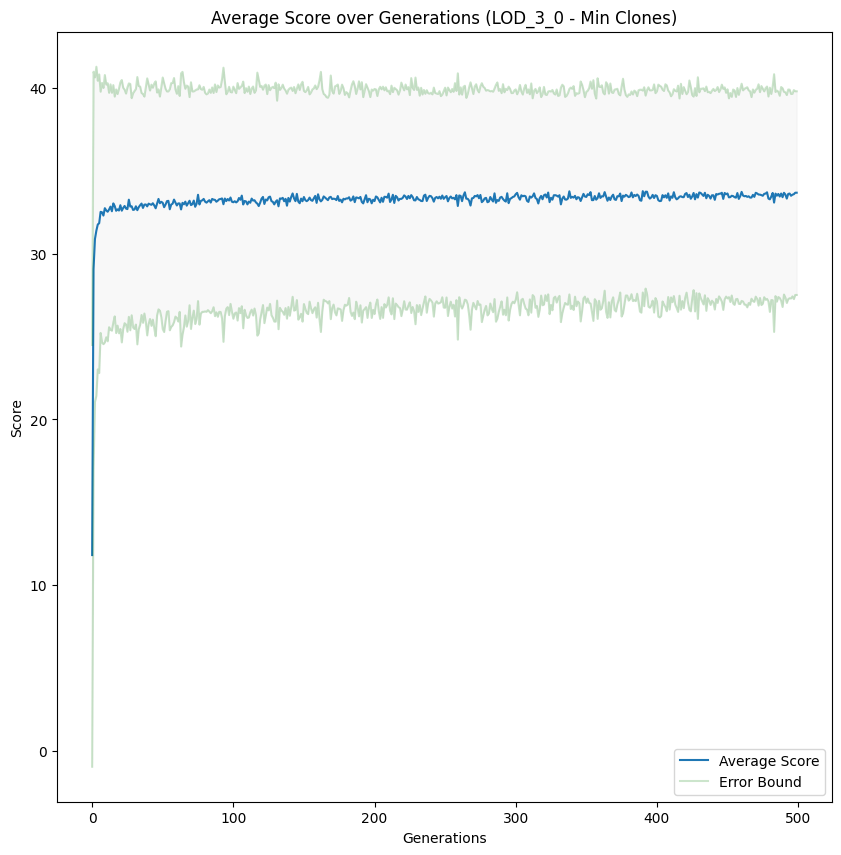

In [ ]:
files_3_0 = []
for file in fullFilePaths:
    if "LOD_3_0" in file:
        files_3_0.append(file)

# create inital df
df_3_0 = pd.read_csv(files_3_0[0])
df_3_0_score = df_3_0[['score']]

# loop through all the different files
for file in files_3_0[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    score = LOD_data[['score']]
    df_3_0_score = pd.concat([df_3_0_score, score], axis=1)

df_3_0_score['mean'] = df_3_0_score.mean(axis=1)
df_3_0_score['std'] = df_3_0_score.std(axis=1)
df_3_0_score['hstd'] = df_3_0_score['mean'] + (2*df_3_0_score.std(axis=1))
df_3_0_score['lstd'] = df_3_0_score['mean'] - (2*df_3_0_score.std(axis=1))

plt.figure(figsize=(10,10))
plt.title('Average Score over Generations (LOD_3_0 - Min Clones)')
plt.xlabel('Generations')
plt.ylabel('Score')
plt.plot(range(500), df_3_0_score['mean'], label='Average Score')
plt.plot(range(500), df_3_0_score['hstd'], label='Error Bound', alpha=0.2, color='green')
plt.plot(range(500), df_3_0_score['lstd'], alpha=0.2, color='green')
plt.fill_between(range(500), df_3_0_score['lstd'], df_3_0_score['hstd'], color='grey', alpha=0.05)
plt.legend()
plt.show()

C:\Users\tveldhuis\AppData\Local\Temp\ipykernel_12016\2290393812.py:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_3_0_rScores['rawScores'] = df_3_0_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')


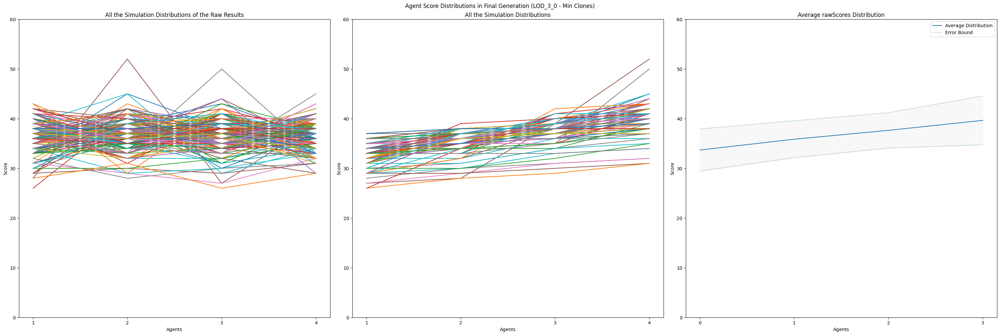

In [ ]:
df_3_0_rScores = df_3_0[['rawScores']].tail(1)

# loop through all the different files
for file in files_3_0[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    rawScore = LOD_data[['rawScores']].tail(1)
    df_3_0_rScores = pd.concat([df_3_0_rScores, rawScore], axis=0)
    
df_3_0_rScores['rawScores'] = df_3_0_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')
df_3_0_rScoresSorted = pd.DataFrame(np.sort(df_3_0_rScores["rawScores"].str.split(',', expand=True).values.astype(float)), columns=['1', '2', '3', '4'])
df_3_0_rScores = pd.DataFrame(df_3_0_rScores["rawScores"].str.split(',', expand=True).values.astype(float), columns=['1', '2', '3', '4'])

fig, axs = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)
fig.suptitle('Agent Score Distributions in Final Generation (LOD_3_0 - Min Clones)')

ymax = 60
hstd_3_0 = df_3_0_rScoresSorted.mean(axis=0)+(2*df_3_0_rScoresSorted.std(axis=0))
lstd_3_0 = df_3_0_rScoresSorted.mean(axis=0)-(2*df_3_0_rScoresSorted.std(axis=0))

# Raw plot for LOD_3_0
axs[0].set_title(f'All the Simulation Distributions of the Raw Results')
axs[0].set_xlabel('Agents')
axs[0].set_ylabel('Score')
axs[0].set_ylim(ymax=ymax)
for index, row in df_3_0_rScores.iterrows():
    axs[0].plot(row, label=index)


# Sorted plot for LOD_3_0
axs[1].set_title(f'All the Simulation Distributions')
axs[1].set_xlabel('Agents')
axs[1].set_ylabel('Score')
axs[1].set_ylim(ymax=ymax)
for index, row in df_3_0_rScoresSorted.iterrows():
    axs[1].plot(row, label=index)

# Plot for LOD_3_0
axs[2].set_title(f'Average rawScores Distribution')
axs[2].set_xlabel('Agents')
axs[2].set_ylabel('Score')
axs[2].set_ylim(ymax=ymax)
axs[2].plot(range(4), df_3_0_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[2].plot(range(4), lstd_3_0, label='Error Bound', alpha=0.2, color='green')
axs[2].plot(range(4), hstd_3_0, alpha=0.2, color='green')
axs[2].fill_between(range(4), lstd_3_0, hstd_3_0, color='grey', alpha=0.05)
axs[2].set_xticks(range(4), range(4))
axs[2].legend()

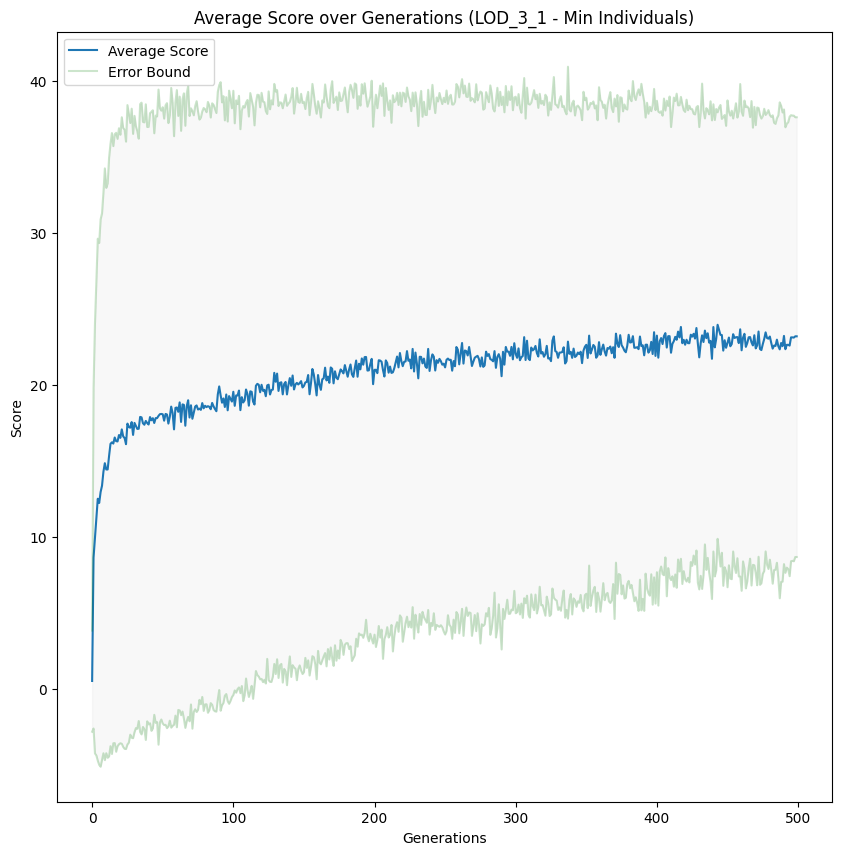

In [ ]:
files_3_1 = []
for file in fullFilePaths:
    if "LOD_3_1" in file:
        files_3_1.append(file)

# create inital df
df_3_1 = pd.read_csv(files_3_1[0])
df_3_1_score = df_3_1[['score']]

# loop through all the different files
for file in files_3_1[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    score = LOD_data[['score']]
    df_3_1_score = pd.concat([df_3_1_score, score], axis=1)

df_3_1_score['mean'] = df_3_1_score.mean(axis=1)
df_3_1_score['std'] = df_3_1_score.std(axis=1)
df_3_1_score['hstd'] = df_3_1_score['mean'] + (2*df_3_1_score.std(axis=1))
df_3_1_score['lstd'] = df_3_1_score['mean'] - (2*df_3_1_score.std(axis=1))

plt.figure(figsize=(10,10))
plt.title('Average Score over Generations (LOD_3_1 - Min Individuals)')
plt.xlabel('Generations')
plt.ylabel('Score')
plt.plot(range(500), df_3_1_score['mean'], label='Average Score')
plt.plot(range(500), df_3_1_score['hstd'], label='Error Bound', alpha=0.2, color='green')
plt.plot(range(500), df_3_1_score['lstd'], alpha=0.2, color='green')
plt.fill_between(range(500), df_3_1_score['lstd'], df_3_1_score['hstd'], color='grey', alpha=0.05)
plt.legend()
plt.show()

C:\Users\tveldhuis\AppData\Local\Temp\ipykernel_12016\3882917993.py:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_3_1_rScores['rawScores'] = df_3_1_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')


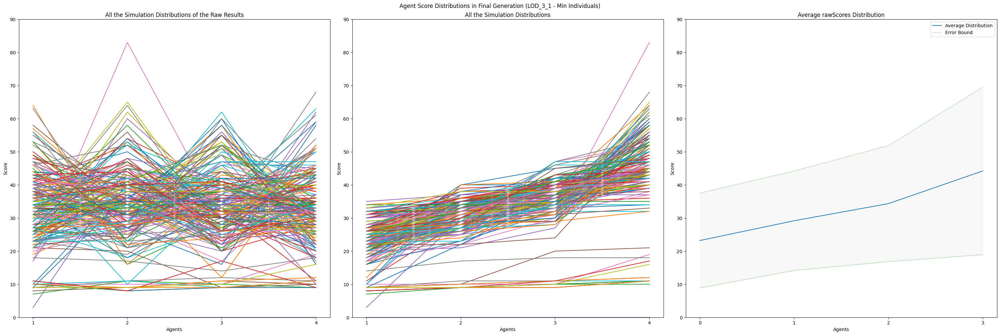

In [ ]:
df_3_1_rScores = df_3_1[['rawScores']].tail(1)

# loop through all the different files
for file in files_3_1[1::]:
    # read the files
    LOD_data = pd.read_csv(file)
    rawScore = LOD_data[['rawScores']].tail(1)
    df_3_1_rScores = pd.concat([df_3_1_rScores, rawScore], axis=0)
    
df_3_1_rScores['rawScores'] = df_3_1_rScores['rawScores'].str.replace(r'[', '').str.replace(r']', '')
df_3_1_rScoresSorted = pd.DataFrame(np.sort(df_3_1_rScores["rawScores"].str.split(',', expand=True).values.astype(float)), columns=['1', '2', '3', '4'])
df_3_1_rScores = pd.DataFrame(df_3_1_rScores["rawScores"].str.split(',', expand=True).values.astype(float), columns=['1', '2', '3', '4'])

fig, axs = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)
fig.suptitle('Agent Score Distributions in Final Generation (LOD_3_1 - Min Individuals)')

ymax = 90
hstd_3_1 = df_3_1_rScoresSorted.mean(axis=0)+(2*df_3_1_rScoresSorted.std(axis=0))
lstd_3_1 = df_3_1_rScoresSorted.mean(axis=0)-(2*df_3_1_rScoresSorted.std(axis=0))

# Raw plot for LOD_3_1
axs[0].set_title(f'All the Simulation Distributions of the Raw Results')
axs[0].set_xlabel('Agents')
axs[0].set_ylabel('Score')
axs[0].set_ylim(ymax=ymax)
for index, row in df_3_1_rScores.iterrows():
    axs[0].plot(row, label=index)


# Sorted plot for LOD_3_1
axs[1].set_title(f'All the Simulation Distributions')
axs[1].set_xlabel('Agents')
axs[1].set_ylabel('Score')
axs[1].set_ylim(ymax=ymax)
for index, row in df_3_1_rScoresSorted.iterrows():
    axs[1].plot(row, label=index)

# Plot for LOD_3_1
axs[2].set_title(f'Average rawScores Distribution')
axs[2].set_xlabel('Agents')
axs[2].set_ylabel('Score')
axs[2].set_ylim(ymax=ymax)
axs[2].plot(range(4), df_3_1_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[2].plot(range(4), lstd_3_1, label='Error Bound', alpha=0.2, color='green')
axs[2].plot(range(4), hstd_3_1, alpha=0.2, color='green')
axs[2].fill_between(range(4), lstd_3_1, hstd_3_1, color='grey', alpha=0.05)
axs[2].set_xticks(range(4), range(4))
axs[2].legend()

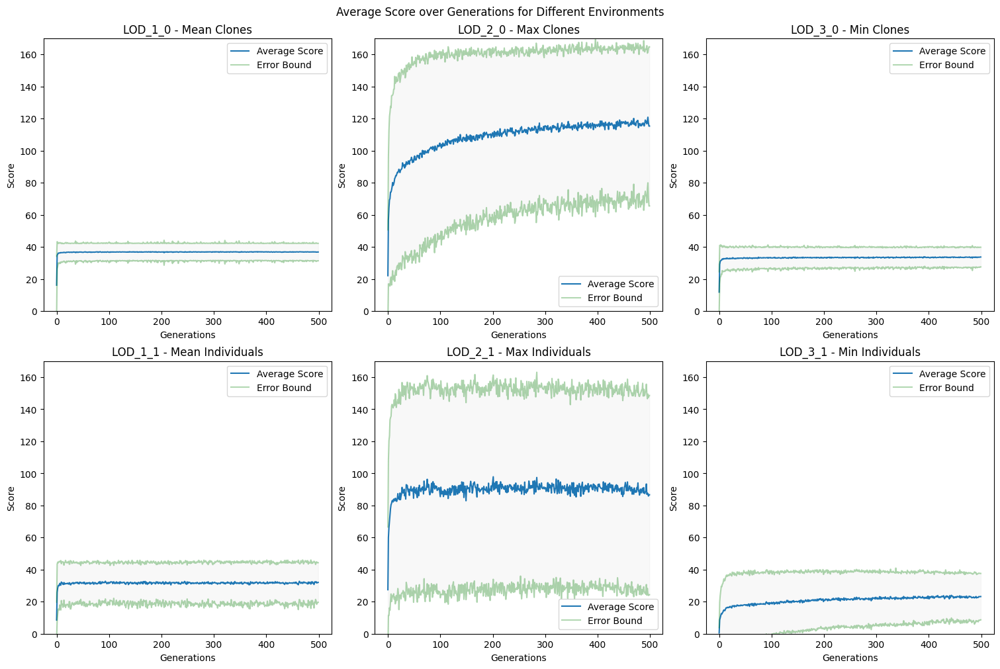

In [18]:
fig, axs = plt.subplots(2, 3, figsize=(15,10), constrained_layout=True)
fig.suptitle('Average Score over Generations for Different Environments')

error_bound_alpha = 0.3
fill_between_alpha = 0.05
ymax = 170

# Plot for LOD_1_0
axs[0, 0].set_title(f'LOD_1_0 - Mean Clones')
axs[0, 0].set_xlabel('Generations')
axs[0, 0].set_ylabel('Score')
axs[0, 0].set_ylim(ymax=ymax)
axs[0, 0].plot(range(500), df_1_0_score['mean'], label='Average Score')
axs[0, 0].plot(range(500), df_1_0_score['hstd'], label='Error Bound', alpha=error_bound_alpha, color='green')
axs[0, 0].plot(range(500), df_1_0_score['lstd'], alpha=error_bound_alpha, color='green')
axs[0, 0].fill_between(range(500), df_1_0_score['lstd'], df_1_0_score['hstd'], color='grey', alpha=fill_between_alpha)
axs[0, 0].legend()

# Plot for LOD_1_1
axs[1, 0].set_title(f'LOD_1_1 - Mean Individuals')
axs[1, 0].set_xlabel('Generations')
axs[1, 0].set_ylabel('Score')
axs[1, 0].set_ylim(ymax=ymax)
axs[1, 0].plot(range(500), df_1_1_score['mean'], label='Average Score')
axs[1, 0].plot(range(500), df_1_1_score['hstd'], label='Error Bound', alpha=error_bound_alpha, color='green')
axs[1, 0].plot(range(500), df_1_1_score['lstd'], alpha=error_bound_alpha, color='green')
axs[1, 0].fill_between(range(500), df_1_1_score['lstd'], df_1_1_score['hstd'], color='grey', alpha=fill_between_alpha)
axs[1, 0].legend()

# Plot for LOD_2_0
axs[0, 1].set_title(f'LOD_2_0 - Max Clones')
axs[0, 1].set_xlabel('Generations')
axs[0, 1].set_ylabel('Score')
axs[0, 1].set_ylim(ymax=ymax)
axs[0, 1].plot(range(500), df_2_0_score['mean'], label='Average Score')
axs[0, 1].plot(range(500), df_2_0_score['hstd'], label='Error Bound', alpha=error_bound_alpha, color='green')
axs[0, 1].plot(range(500), df_2_0_score['lstd'], alpha=error_bound_alpha, color='green')
axs[0, 1].fill_between(range(500), df_2_0_score['lstd'], df_2_0_score['hstd'], color='grey', alpha=fill_between_alpha)
axs[0, 1].legend()

# Plot for LOD_2_1
axs[1, 1].set_title(f'LOD_2_1 - Max Individuals')
axs[1, 1].set_xlabel('Generations')
axs[1, 1].set_ylabel('Score')
axs[1, 1].set_ylim(ymax=ymax)
axs[1, 1].plot(range(500), df_2_1_score['mean'], label='Average Score')
axs[1, 1].plot(range(500), df_2_1_score['hstd'], label='Error Bound', alpha=error_bound_alpha, color='green')
axs[1, 1].plot(range(500), df_2_1_score['lstd'], alpha=error_bound_alpha, color='green')
axs[1, 1].fill_between(range(500), df_2_1_score['lstd'], df_2_1_score['hstd'], color='grey', alpha=fill_between_alpha)
axs[1, 1].legend()

# Plot for LOD_3_0
axs[0, 2].set_title(f'LOD_3_0 - Min Clones')
axs[0, 2].set_xlabel('Generations')
axs[0, 2].set_ylabel('Score')
axs[0, 2].set_ylim(ymax=ymax)
axs[0, 2].plot(range(500), df_3_0_score['mean'], label='Average Score')
axs[0, 2].plot(range(500), df_3_0_score['hstd'], label='Error Bound', alpha=error_bound_alpha, color='green')
axs[0, 2].plot(range(500), df_3_0_score['lstd'], alpha=error_bound_alpha, color='green')
axs[0, 2].fill_between(range(500), df_3_0_score['lstd'], df_3_0_score['hstd'], color='grey', alpha=fill_between_alpha)
axs[0, 2].legend()

# Plot for LOD_3_1
axs[1, 2].set_title(f'LOD_3_1 - Min Individuals')
axs[1, 2].set_xlabel('Generations')
axs[1, 2].set_ylabel('Score')
axs[1, 2].set_ylim(ymax=ymax)
axs[1, 2].plot(range(500), df_3_1_score['mean'], label='Average Score')
axs[1, 2].plot(range(500), df_3_1_score['hstd'], label='Error Bound', alpha=error_bound_alpha, color='green')
axs[1, 2].plot(range(500), df_3_1_score['lstd'], alpha=error_bound_alpha, color='green')
axs[1, 2].fill_between(range(500), df_3_1_score['lstd'], df_3_1_score['hstd'], color='grey', alpha=fill_between_alpha)
axs[1, 2].legend()

fig.savefig('foo.png')

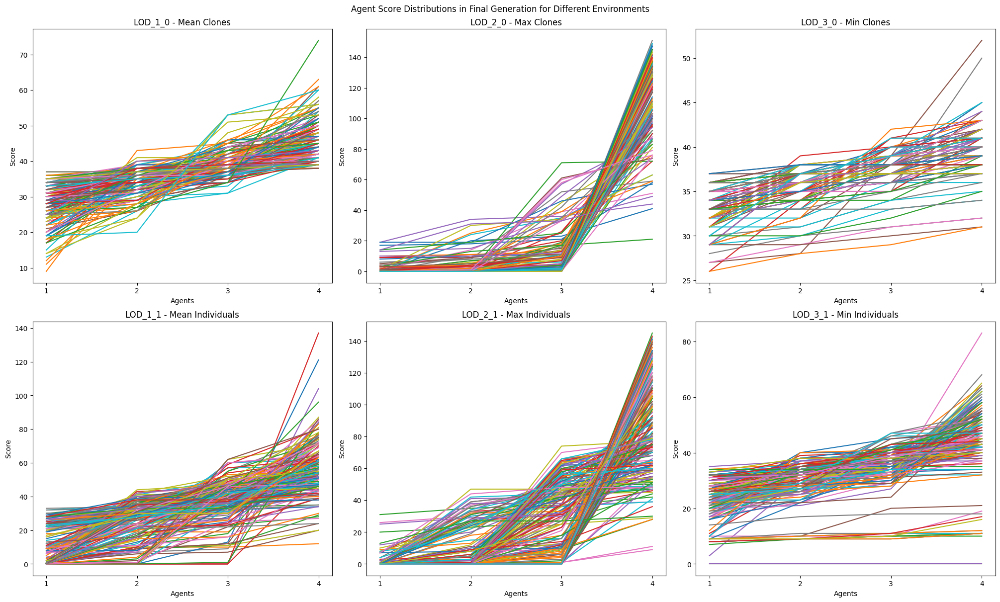

In [23]:
fig, axs = plt.subplots(2, 3, figsize=(20, 12), constrained_layout=True)
fig.suptitle('Agent Score Distributions in Final Generation for Different Environments')



# Plot for LOD_1_0
axs[0, 0].set_title(f'LOD_1_0 - Mean Clones')
axs[0, 0].set_xlabel('Agents')
axs[0, 0].set_ylabel('Score')
for index, row in df_1_0_rScoresSorted.iterrows():
    axs[0, 0].plot(row, label=index)

# Plot for LOD_1_1
axs[1, 0].set_title(f'LOD_1_1 - Mean Individuals')
axs[1, 0].set_xlabel('Agents')
axs[1, 0].set_ylabel('Score')
for index, row in df_1_1_rScoresSorted.iterrows():
    axs[1, 0].plot(row, label=index)

# Plot for LOD_2_0
axs[0, 1].set_title(f'LOD_2_0 - Max Clones')
axs[0, 1].set_xlabel('Agents')
axs[0, 1].set_ylabel('Score')
for index, row in df_2_0_rScoresSorted.iterrows():
    axs[0, 1].plot(row, label=index)

# Plot for LOD_2_1
axs[1, 1].set_title(f'LOD_2_1 - Max Individuals')
axs[1, 1].set_xlabel('Agents')
axs[1, 1].set_ylabel('Score')
for index, row in df_2_1_rScoresSorted.iterrows():
    axs[1, 1].plot(row, label=index)

# Plot for LOD_3_0
axs[0, 2].set_title(f'LOD_3_0 - Min Clones')
axs[0, 2].set_xlabel('Agents')
axs[0, 2].set_ylabel('Score')
for index, row in df_3_0_rScoresSorted.iterrows():
    axs[0, 2].plot(row, label=index)

# Plot for LOD_3_1
axs[1, 2].set_title(f'LOD_3_1 - Min Individuals')
axs[1, 2].set_xlabel('Agents')
axs[1, 2].set_ylabel('Score')
for index, row in df_3_1_rScoresSorted.iterrows():
    axs[1, 2].plot(row, label=index)

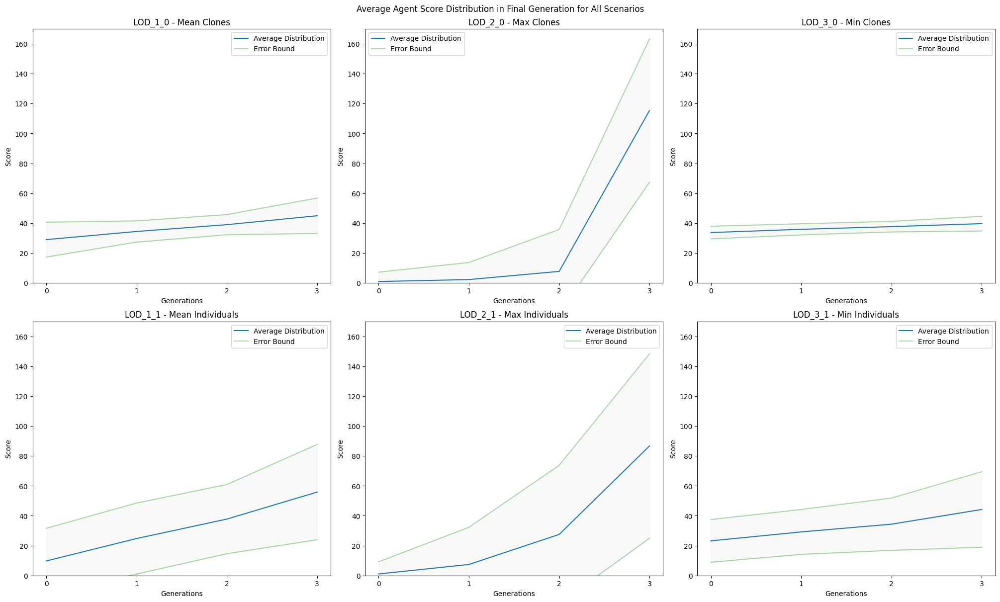

In [20]:
fig, axs = plt.subplots(2, 3, figsize=(20, 12), constrained_layout=True)
fig.suptitle('Average Agent Score Distribution in Final Generation for All Scenarios')

error_bound_alpha = 0.3
fill_between_alpha = 0.05
ymax = 170

# Plot for LOD_1_0
axs[0, 0].set_title(f'LOD_1_0 - Mean Clones')
axs[0, 0].set_xlabel('Generations')
axs[0, 0].set_ylabel('Score')
axs[0, 0].set_ylim(ymax=ymax)
axs[0, 0].plot(range(4), df_1_0_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[0, 0].plot(range(4), lstd_1_0, label='Error Bound', alpha=error_bound_alpha, color='green')
axs[0, 0].plot(range(4), hstd_1_0, alpha=error_bound_alpha, color='green')
axs[0, 0].fill_between(range(4), lstd_1_0, hstd_1_0, color='grey', alpha=fill_between_alpha)
axs[0, 0].set_xticks(range(4), range(4))
axs[0, 0].legend()

# Plot for LOD_1_1
axs[1, 0].set_title(f'LOD_1_1 - Mean Individuals')
axs[1, 0].set_xlabel('Generations')
axs[1, 0].set_ylabel('Score')
axs[1, 0].set_ylim(ymax=ymax)
axs[1, 0].plot(range(4), df_1_1_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[1, 0].plot(range(4), lstd_1_1, label='Error Bound', alpha=error_bound_alpha, color='green')
axs[1, 0].plot(range(4), hstd_1_1, alpha=error_bound_alpha, color='green')
axs[1, 0].fill_between(range(4), lstd_1_1, hstd_1_1, color='grey', alpha=fill_between_alpha)
axs[1, 0].set_xticks(range(4), range(4))
axs[1, 0].legend()

# Plot for LOD_2_0
axs[0, 1].set_title(f'LOD_2_0 - Max Clones')
axs[0, 1].set_xlabel('Generations')
axs[0, 1].set_ylabel('Score')
axs[0, 1].set_ylim(ymax=ymax)
axs[0, 1].plot(range(4), df_2_0_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[0, 1].plot(range(4), lstd_2_0, label='Error Bound', alpha=error_bound_alpha, color='green')
axs[0, 1].plot(range(4), hstd_2_0, alpha=error_bound_alpha, color='green')
axs[0, 1].fill_between(range(4), lstd_2_0, hstd_2_0, color='grey', alpha=fill_between_alpha)
axs[0, 1].set_xticks(range(4), range(4))
axs[0, 1].legend()

# Plot for LOD_2_1
axs[1, 1].set_title(f'LOD_2_1 - Max Individuals')
axs[1, 1].set_xlabel('Generations')
axs[1, 1].set_ylabel('Score')
axs[1, 1].set_ylim(ymax=ymax)
axs[1, 1].plot(range(4), df_2_1_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[1, 1].plot(range(4), lstd_2_1, label='Error Bound', alpha=error_bound_alpha, color='green')
axs[1, 1].plot(range(4), hstd_2_1, alpha=error_bound_alpha, color='green')
axs[1, 1].fill_between(range(4), lstd_2_1, hstd_2_1, color='grey', alpha=fill_between_alpha)
axs[1, 1].set_xticks(range(4), range(4))
axs[1, 1].legend()

# Plot for LOD_3_0
axs[0, 2].set_title(f'LOD_3_0 - Min Clones')
axs[0, 2].set_xlabel('Generations')
axs[0, 2].set_ylabel('Score')
axs[0, 2].set_ylim(ymax=ymax)
axs[0, 2].plot(range(4), df_3_0_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[0, 2].plot(range(4), lstd_3_0, label='Error Bound', alpha=error_bound_alpha, color='green')
axs[0, 2].plot(range(4), hstd_3_0, alpha=error_bound_alpha, color='green')
axs[0, 2].fill_between(range(4), lstd_3_0, hstd_3_0, color='grey', alpha=fill_between_alpha)
axs[0, 2].set_xticks(range(4), range(4))
axs[0, 2].legend()

# Plot for LOD_3_1
axs[1, 2].set_title(f'LOD_3_1 - Min Individuals')
axs[1, 2].set_xlabel('Generations')
axs[1, 2].set_ylabel('Score')
axs[1, 2].set_ylim(ymax=ymax)
axs[1, 2].plot(range(4), df_3_1_rScoresSorted.mean(axis=0), label='Average Distribution')
axs[1, 2].plot(range(4), lstd_3_1, label='Error Bound', alpha=error_bound_alpha, color='green')
axs[1, 2].plot(range(4), hstd_3_1, alpha=error_bound_alpha, color='green')
axs[1, 2].fill_between(range(4), lstd_3_1, hstd_3_1, color='grey', alpha=fill_between_alpha)
axs[1, 2].set_xticks(range(4), range(4))
axs[1, 2].legend()

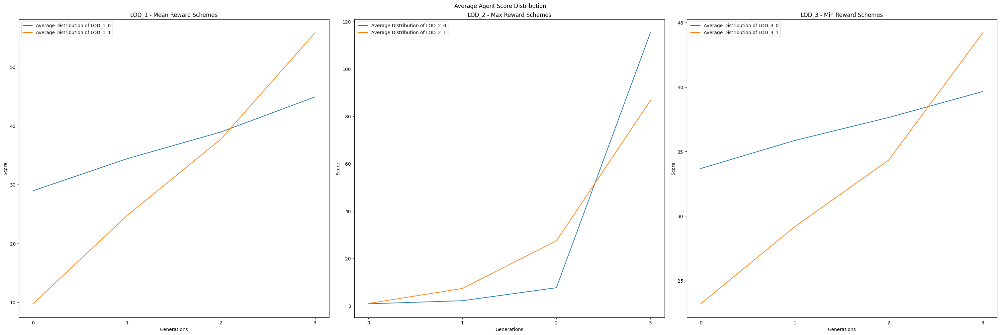

In [21]:
fig, axs = plt.subplots(1, 3, figsize=(30, 10), constrained_layout=True)
fig.suptitle('Average Agent Score Distribution')

error_bound_alpha = 0.3
fill_between_alpha = 0.05

# Plot for LOD_1
axs[0].set_title(f'LOD_1 - Mean Reward Schemes')
axs[0].set_xlabel('Generations')
axs[0].set_ylabel('Score')
axs[0].plot(range(4), df_1_0_rScoresSorted.mean(axis=0), label='Average Distribution of LOD_1_0')
axs[0].plot(range(4), df_1_1_rScoresSorted.mean(axis=0), label='Average Distribution of LOD_1_1')
axs[0].set_xticks(range(4), range(4))
axs[0].legend()

# Plot for LOD_2
axs[1].set_title(f'LOD_2 - Max Reward Schemes')
axs[1].set_xlabel('Generations')
axs[1].set_ylabel('Score')
axs[1].plot(range(4), df_2_0_rScoresSorted.mean(axis=0), label='Average Distribution of LOD_2_0')
axs[1].plot(range(4), df_2_1_rScoresSorted.mean(axis=0), label='Average Distribution of LOD_2_1')
axs[1].set_xticks(range(4), range(4))
axs[1].legend()

# Plot for LOD_3
axs[2].set_title(f'LOD_3 - Min Reward Schemes')
axs[2].set_xlabel('Generations')
axs[2].set_ylabel('Score')
axs[2].plot(range(4), df_3_0_rScoresSorted.mean(axis=0), label='Average Distribution of LOD_3_0')
axs[2].plot(range(4), df_3_1_rScoresSorted.mean(axis=0), label='Average Distribution of LOD_3_1')
axs[2].set_xticks(range(4), range(4))
axs[2].legend()

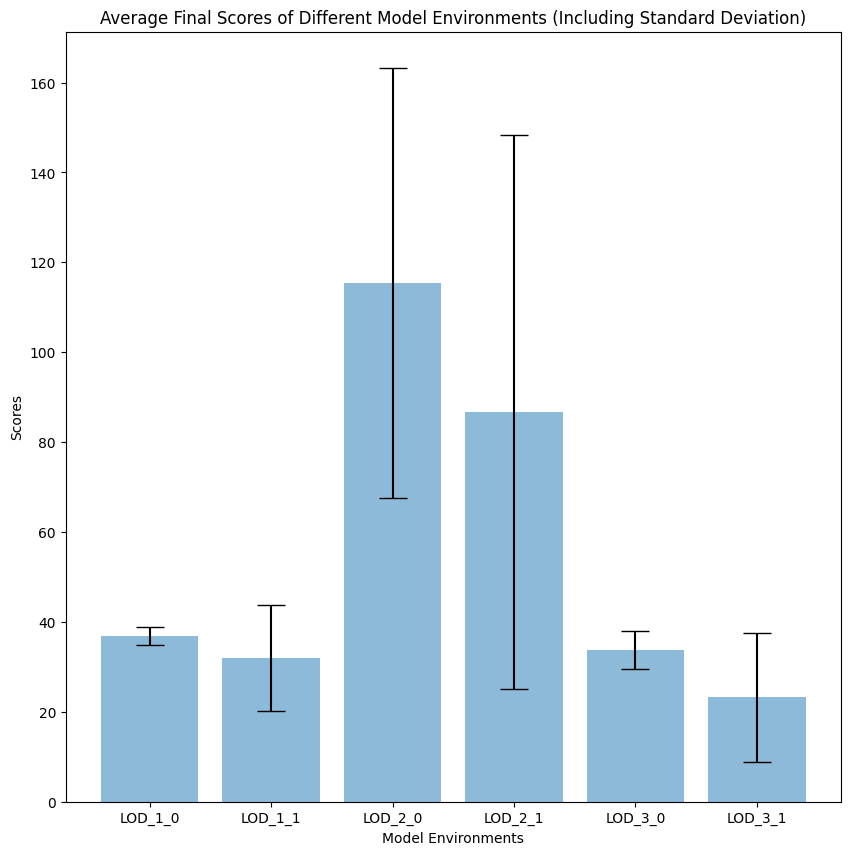

In [22]:
mean_list = [df_1_0_score.iloc[-1]['mean'], df_1_1_score.iloc[-1]['mean'], df_2_0_score.iloc[-1]['mean'], df_2_1_score.iloc[-1]['mean'], df_3_0_score.iloc[-1]['mean'], df_3_1_score.iloc[-1]['mean']]
std_list = [2*df_1_0_score.iloc[-1]['std'], 2*df_1_1_score.iloc[-1]['std'], 2*df_2_0_score.iloc[-1]['std'], 2*df_2_1_score.iloc[-1]['std'], 2*df_3_0_score.iloc[-1]['std'], 2*df_3_1_score.iloc[-1]['std']]
LOD_list = ["LOD_1_0","LOD_1_1","LOD_2_0","LOD_2_1","LOD_3_0","LOD_3_1"]

plt.figure(figsize=(10,10))
plt.title('Average Final Scores of Different Model Environments (Including Standard Deviation)')
plt.xlabel("Model Environments")
plt.ylabel("Scores")
plt.bar(LOD_list, mean_list, yerr=std_list, align='center', alpha=0.5, ecolor='black', capsize=10)
plt.show()